### Reading data

In [53]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

In [54]:
filename = 'Ndata.csv'
data = pd.read_csv(filename)
data.rename(columns={data.columns[0]: "id"}, inplace=True) 
pd.set_option('display.max_columns', None) # To show all columns
data.sample(1)

,id,ALT,HDL,Cholesterol,weight(kg),LDL,age,hearing(left),waist(cm),hemoglobin,height(cm),smoking
72096,72096,27,34,201,65,121,55,1,84.6,15.7,165,1


### Data cleaning & removing outliers

#### info

In [55]:
# understanding the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159256 entries, 0 to 159255
Data columns (total 12 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   id             159256 non-null  int64  
 1   ALT            159256 non-null  int64  
 2   HDL            159256 non-null  int64  
 3   Cholesterol    159256 non-null  int64  
 4   weight(kg)     159256 non-null  int64  
 5   LDL            159256 non-null  int64  
 6   age            159256 non-null  int64  
 7   hearing(left)  159256 non-null  int64  
 8   waist(cm)      159256 non-null  float64
 9   hemoglobin     159256 non-null  float64
 10  height(cm)     159256 non-null  int64  
 11  smoking        159256 non-null  int64  
dtypes: float64(2), int64(10)
memory usage: 14.6 MB


In [56]:
# finding null values
data.isna().sum()

id               0
ALT              0
HDL              0
Cholesterol      0
weight(kg)       0
LDL              0
age              0
hearing(left)    0
waist(cm)        0
hemoglobin       0
height(cm)       0
smoking          0
dtype: int64

No nulls in data

In [57]:
# descripe the data
pd.set_option('display.max_columns', None)
data.describe()

,id,ALT,HDL,Cholesterol,weight(kg),LDL,age,hearing(left),waist(cm),hemoglobin,height(cm),smoking
count,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000
mean,79627.500000,26.550296,55.852684,195.796165,67.143662,114.607682,44.306626,1.023974,83.001990,14.796965,165.266929,0.437365
std,45973.391572,17.753070,13.964141,28.396959,12.586198,28.158931,11.842286,0.152969,8.957937,1.431213,8.818970,0.496063
min,0.000000,1.000000,9.000000,77.000000,30.000000,1.000000,20.000000,1.000000,51.000000,4.900000,135.000000,0.000000
25%,39813.750000,16.000000,45.000000,175.000000,60.000000,95.000000,40.000000,1.000000,77.000000,13.800000,160.000000,0.000000
50%,79627.500000,22.000000,54.000000,196.000000,65.000000,114.000000,40.000000,1.000000,83.000000,15.000000,165.000000,0.000000
75%,119441.250000,32.000000,64.000000,217.000000,75.000000,133.000000,55.000000,1.000000,89.000000,15.800000,170.000000,1.000000
max,159255.000000,2914.000000,136.000000,393.000000,130.000000,1860.000000,85.000000,2.000000,127.000000,21.000000,190.000000,1.000000


There are some outliers needed to be handled like LDL

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\1225254124.py:14: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\1225254124.py:14: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\1225254124.py:14: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\1225254124.py:14: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\1225254124.py:14: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\1225254124.py:14: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\1225254124.py:14: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\1225254124.py:14: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\L

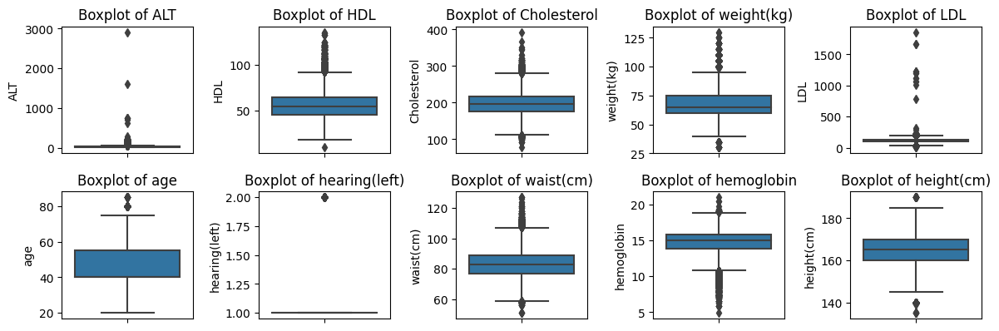

In [58]:
# box plot for columns
numerical_cols = ['ALT', 'HDL', 'Cholesterol', 'weight(kg)', 'LDL', 'age', 'hearing(left)', 'waist(cm)', 'hemoglobin', 'height(cm)']
# [
#     'age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'systolic', 
#     'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 
#     'HDL','hemoglobin'
# ]

plt.figure(figsize=(12, 10))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 5, i)  
    sns.boxplot(y=data[col])
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()

plt.show()

The outliers appears clearly with these plots

#### Removing data

In [59]:
# handling outliers       
# The mean is sensitive to outliers
for col in data.select_dtypes(include=[np.number]).columns:
    if col =='dental caries':
        continue
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_bound = Q3 + 1.8 * IQR
    lower_bound = Q1 - 1.5 * IQR
    outliers_below = data[data[col] < lower_bound].shape[0]
    outliers_above = data[data[col] > upper_bound].shape[0]
    if outliers_below + outliers_above > 500:
        # handle values above the upper bound
        data[col] = np.where(data[col] > upper_bound, upper_bound, data[col])
        # handle values below the lower bound
        data[col] = np.where(data[col] < lower_bound, lower_bound, data[col])
    else :
        upper_bound = Q3 + 1.6 * IQR
        lower_bound = Q1 - IQR
        data[col] = np.where(data[col] > upper_bound, upper_bound, data[col])
        data[col] = np.where(data[col] < lower_bound, lower_bound, data[col])

Here I needed to keep some outliers to see the smoking effect on health.

In [60]:
# discripe the data after handling the outliers
# we can consider it as Univariate Analysis also
data.describe()

,id,ALT,HDL,Cholesterol,weight(kg),LDL,age,hearing(left),waist(cm),hemoglobin,height(cm),smoking
count,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.0,159256.000000,159256.000000,159256.000000,159256.000000
mean,79627.500000,25.923458,55.826788,195.835558,67.113562,114.546457,44.421366,1.0,83.034845,14.807563,165.378290,0.437365
std,45973.391572,12.916673,13.872204,28.163075,12.483615,25.761897,11.601336,0.0,8.822533,1.393455,8.577791,0.496063
min,0.000000,1.000000,16.500000,133.000000,37.500000,57.000000,25.000000,1.0,65.000000,10.800000,150.000000,0.000000
25%,39813.750000,16.000000,45.000000,175.000000,60.000000,95.000000,40.000000,1.0,77.000000,13.800000,160.000000,0.000000
50%,79627.500000,22.000000,54.000000,196.000000,65.000000,114.000000,40.000000,1.0,83.000000,15.000000,165.000000,0.000000
75%,119441.250000,32.000000,64.000000,217.000000,75.000000,133.000000,55.000000,1.0,89.000000,15.800000,170.000000,1.000000
max,159255.000000,60.800000,98.200000,284.200000,102.000000,193.800000,79.000000,1.0,108.200000,19.400000,186.000000,1.000000


The table above shows there are no outliers(which is handled) so let's analysis these Features with some plots to do best Feature engineering 

## analysis

### Univariate Analysis

In [61]:
# convert smoking from Numerical to Categorical in a copy data
df = data.copy()
df['smoking'] = df['smoking'].map({0: 'Not Smoking', 1: 'Smoking'})

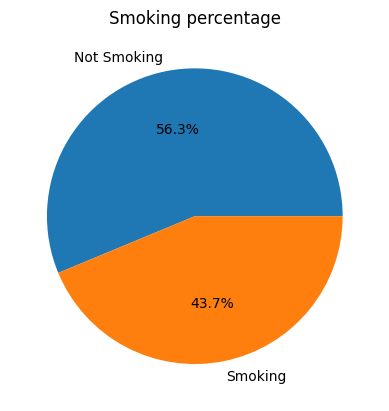

In [62]:
# Pie Chart for smoking
smoking_counts = data['smoking'].value_counts()
custom_labels = ['Not Smoking','Smoking']
# label_mapping = {0: 'Not Smoking', 1: 'Smoking'}
# custom_labels = [label_mapping[key] for key in smoking_counts.index]
plt.pie(smoking_counts, labels=custom_labels, autopct='%1.1f%%')
plt.title('Smoking percentage')
plt.show()

In [63]:
# ploty Pie Chart for smoking
smoking_counts = df['smoking'].value_counts()
fig = px.pie(values=smoking_counts, names=smoking_counts.index, title='Smoking Percentage',width=600,height=400)
fig.show()

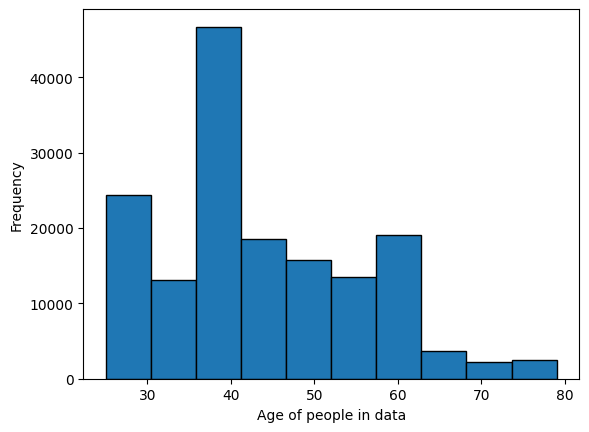

In [64]:
# Histogram for Ages
plt.hist(data['age'], bins=10,edgecolor='black') 
plt.xlabel('Age of people in data') 
plt.ylabel('Frequency') 
plt.show()

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\330721072.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\330721072.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\330721072.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\330721072.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\330721072.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\330721072.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\330721072.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\330721072.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipyker

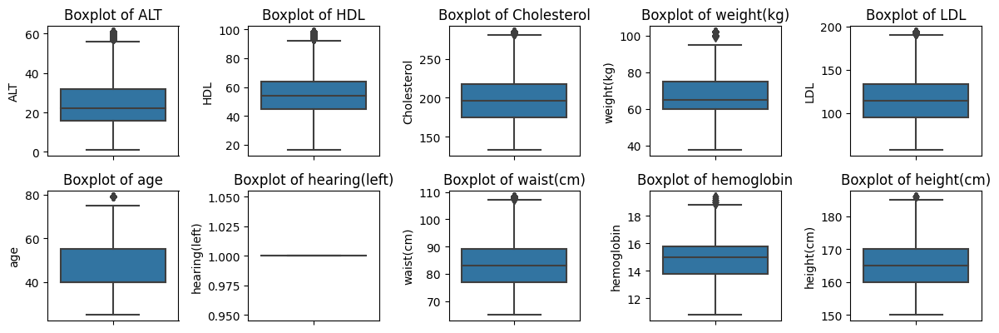

In [65]:
# box plot for columns
numerical_cols = ['ALT', 'HDL', 'Cholesterol', 'weight(kg)', 'LDL', 'age', 'hearing(left)', 'waist(cm)', 'hemoglobin', 'height(cm)']

plt.figure(figsize=(12, 10))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 5, i)  
    sns.boxplot(y=data[col])
    plt.title(f'Boxplot of {col}')
    plt.tight_layout() # case warning but needed to see data

plt.show()


As appeared above 

1- this  data is balanced as converge rate of smoking people and not smoking.

2- Ages of these people has high freq in 40s years people but it have a high distrubution for all adult ages.This could be important for understanding how smoking affects different age demographics.

3- The data is centered around the median, with minimal outliers which is needed to check sick people and see the effect of smoking on people.

### Bivariate Analysis

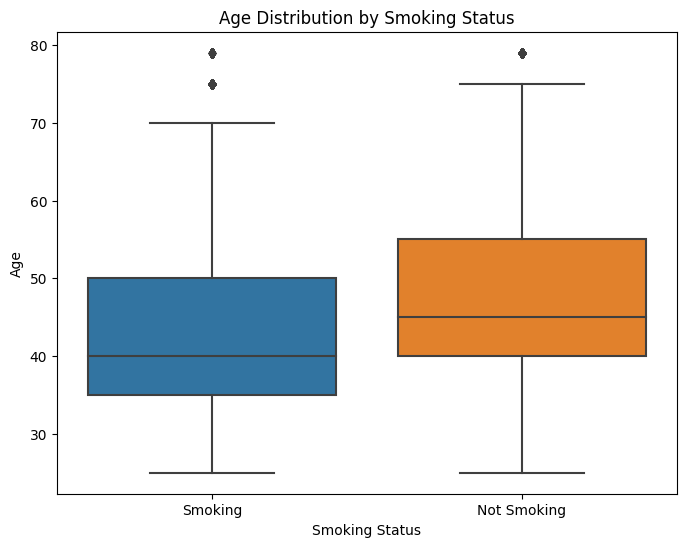

In [66]:
# Box plot for Age Distribution by Smoking Status
plt.figure(figsize=(8, 6))
sns.boxplot(x='smoking', y='age', data=df)  
# plt.xticks([0, 1], ['Not Smoking', 'Smoking']) 
plt.xlabel('Smoking Status')
plt.ylabel('Age')
plt.title('Age Distribution by Smoking Status')
plt.show()
# explore the patterns between Age & Smoking

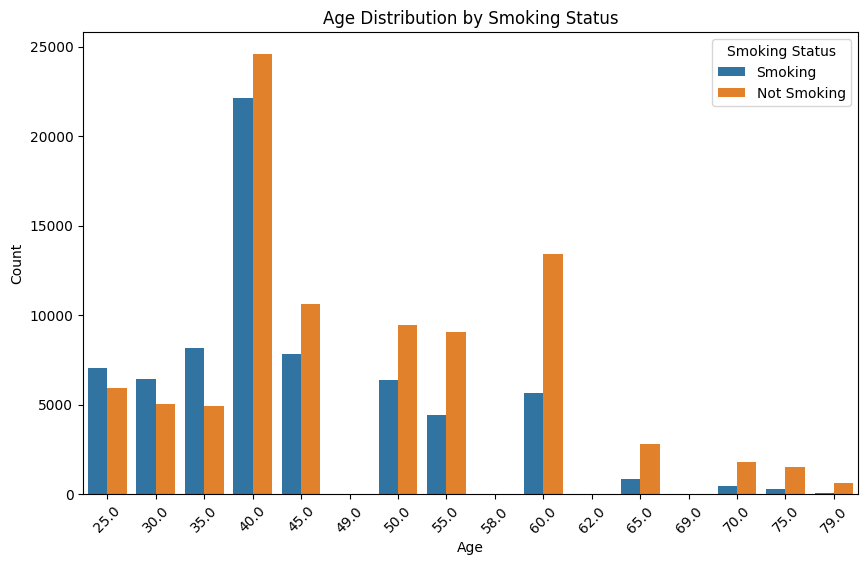

In [67]:
#  count plot for Age Distribution by Smoking Status
plt.figure(figsize=(10, 6)) 
sns.countplot(x='age', hue='smoking', data=df)
plt.xlabel('Age')
plt.ylabel('Count')  
plt.title('Age Distribution by Smoking Status') 
plt.xticks(rotation=45)  
plt.legend(title='Smoking Status') 
plt.show()


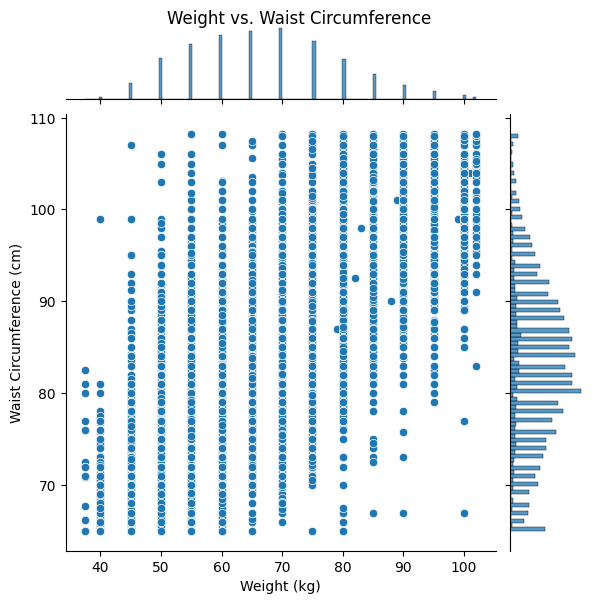

In [68]:
# Scatter plot for Weight vs. Waist Circumference
sns.jointplot(x='weight(kg)', y='waist(cm)', data=data, kind='scatter')
plt.xlabel('Weight (kg)') 
plt.ylabel('Waist Circumference (cm)') 
plt.suptitle('Weight vs. Waist Circumference', y=0.999) 
plt.show()


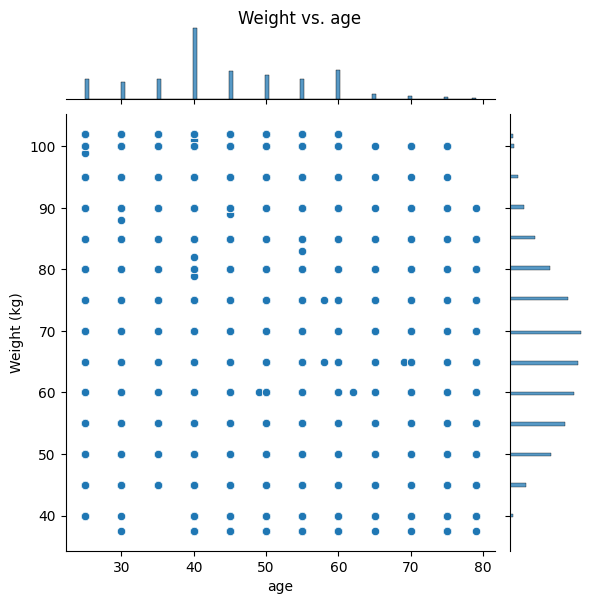

In [69]:
# Scatter plot for Weight vs. age
sns.jointplot(x='age',y='weight(kg)', data=data, kind='scatter')
plt.xlabel('age') 
plt.ylabel('Weight (kg)') 
plt.suptitle('Weight vs. age', y=0.999) 
plt.show()


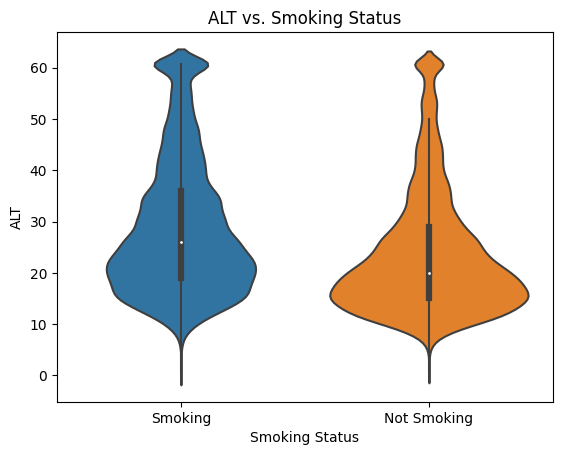

In [70]:
# violin plot for ALT vs. Smoking Status
sns.violinplot(x='smoking', y='ALT', data=df)
plt.xlabel('Smoking Status')
plt.ylabel('ALT')
plt.title('ALT vs. Smoking Status')
plt.show()


In [71]:
# ploty violin plot for Hemoglobin Levels by Smoking Status

fig = px.violin(df, x='smoking', y='hemoglobin', color='smoking',
                title='Hemoglobin Levels by Smoking Status',
                width=600,height=400)

fig.show()


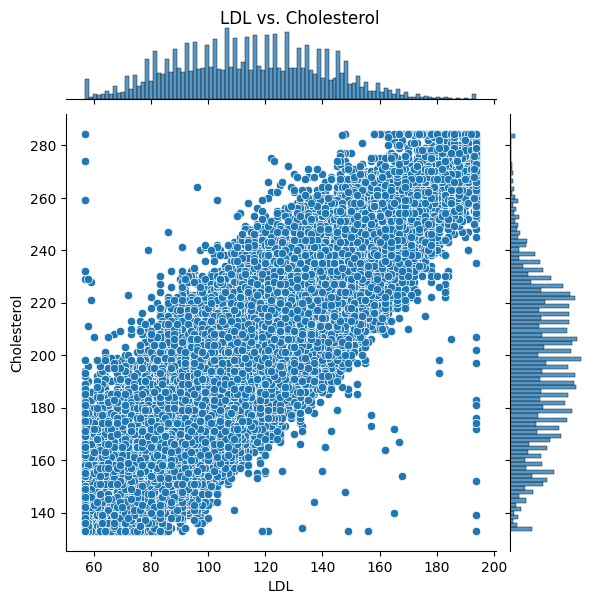

In [72]:
# Scatter plot for LDL vs. Cholesterol
sns.jointplot(x='LDL', y='Cholesterol', data=data, kind='scatter')
plt.xlabel('LDL') 
plt.ylabel('Cholesterol') 
plt.suptitle('LDL vs. Cholesterol', y=0.999) 
plt.show()


here the data refer to 

1- smoking is more spread between younger people than older.

2- there is some features have direct relation between each other in this data.

3- the effect of smoking is appear in Hemoglobin Level as the smokers have higher rate in  Hemoglobin compared to people who not smoke which may cause many problems such as blood clots for smokers.

4- The ALT for smokers is higher than others which show smoking affects in people's body like Liver.

### Multivariate Analysis

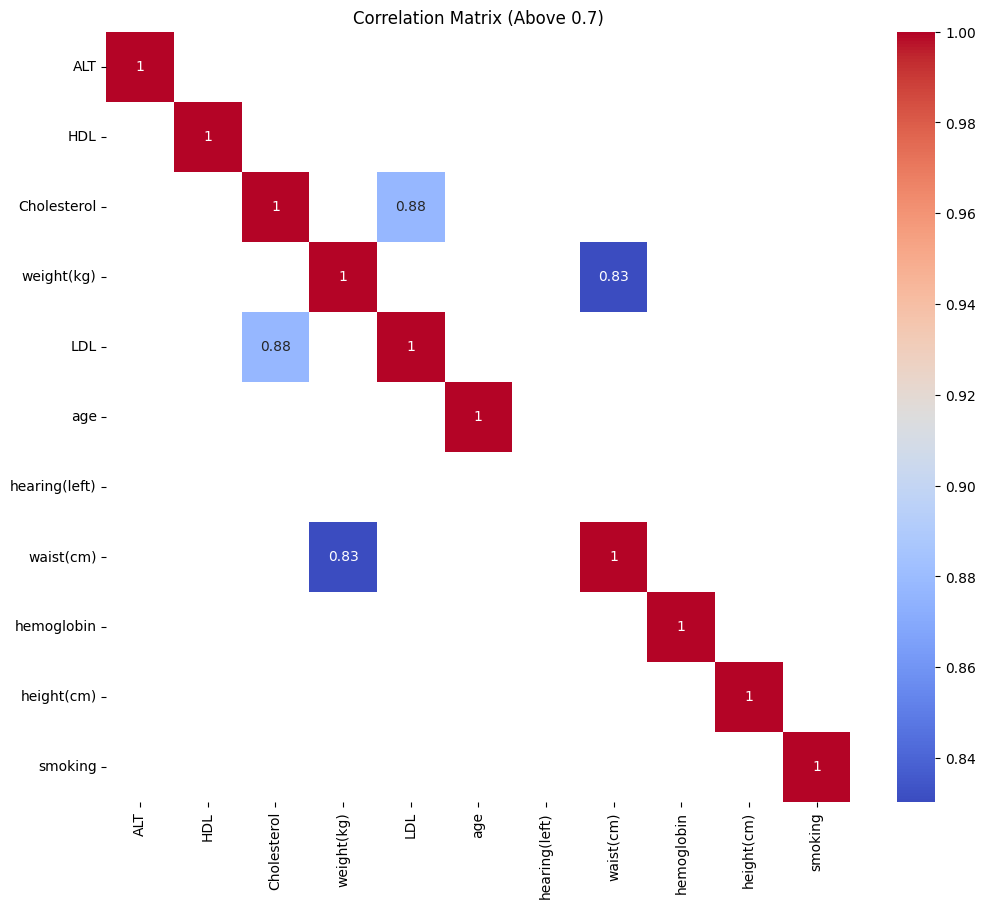

In [73]:
# correlation_matrix for Feature Engineering 
correlation_matrix = data.drop(['id'], axis=1).corr()
threshold = 0.7
strong_corr = correlation_matrix[correlation_matrix.abs() > threshold]
plt.figure(figsize=(12, 10))
sns.heatmap(strong_corr, annot=True, cmap='coolwarm')
plt.title(f'Correlation Matrix (Above {threshold})')
plt.show()


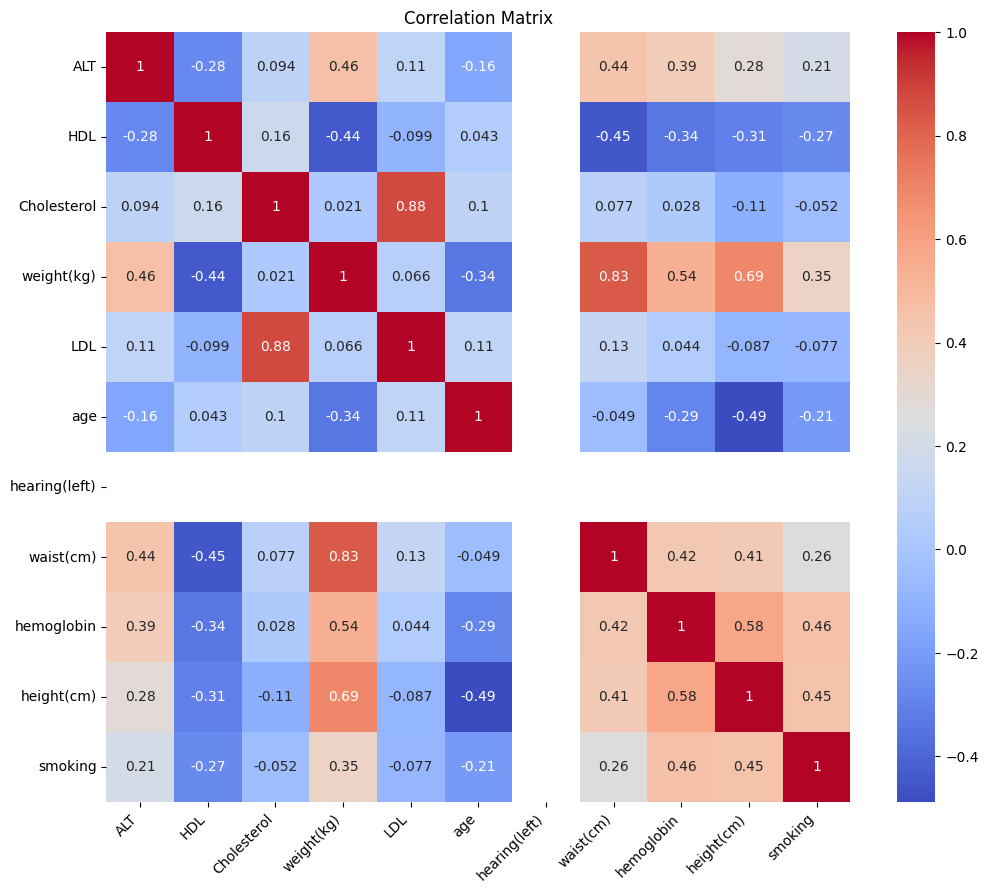

In [74]:
# correlation_matrix for all columns
plt.figure(figsize=(12,10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.xticks(rotation=45, ha='right')  
plt.yticks(rotation=0) 
plt.title('Correlation Matrix')
plt.show()


In [75]:
# correlation_matrix for lower only with threshold
# plt.figure(figsize=(20, 16))
# strong_corr = correlation_matrix[correlation_matrix.abs() > .1]
# mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))  # Mask the upper triangle
# sns.heatmap(strong_corr, annot=True, cmap='coolwarm', mask=mask)
# plt.title('Correlation Matrix')
# plt.show()


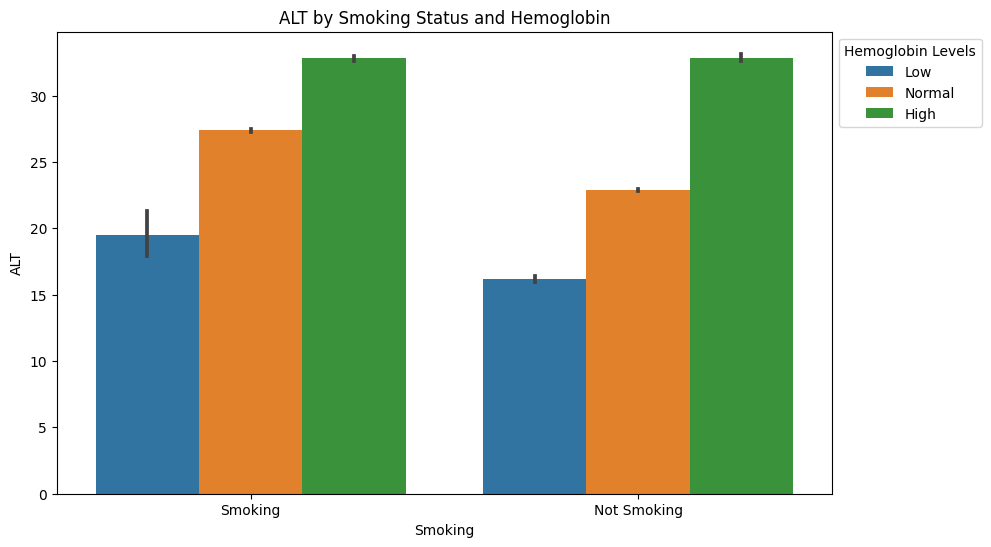

In [76]:
# bar plot for ALT by Smoking Status and Hemoglobin
df['hemoglobin_bins'] = pd.cut(df['hemoglobin'], bins=[0, 12, 16, 21], labels=['Low', 'Normal', 'High'])
plt.figure(figsize=(10, 6))
sns.barplot(x='smoking', y='ALT', hue='hemoglobin_bins', data=df)
plt.xlabel('Smoking')
plt.ylabel('ALT')
plt.title('ALT by Smoking Status and Hemoglobin')
plt.legend(title='Hemoglobin Levels', bbox_to_anchor=(1, 1))  # Adjust legend position
plt.show()


In [77]:
# ploty scatter for HDL vs serum creatinine with smoking status
fig = px.scatter(df,width =900,height = 600, x='age', y='HDL',
                 color='smoking',
                 trendline="ols")
fig.show()

In [78]:
# # Bar plot for Age by Smoking Status and HDL Levels
# df['HDL'] = pd.cut(df['HDL'], bins=[13, 45, 65, 98], labels=['Low', 'Normal', 'High'])
# plt.figure(figsize=(10, 6))
# sns.barplot(x='smoking', y='age', hue='HDL', data=df)
# plt.xlabel('Smoking Status') 
# plt.ylabel('Age')  
# plt.title('Age by Smoking Status and HDL Levels') 
# plt.legend(title='HDL Levels', bbox_to_anchor=(1, 1))  
# plt.show()


The data show that

1- there are some features which is very strong related to each other and other have reverse relation. 

2- there is a column has const values (no affect on data) like hearing(left).

3- smokers' people have higher rate in ALT compared with non-smokers.

### romve this
#### theoretical notes 
You can also use feature selection techniques (e.g., Recursive Feature Elimination, Lasso regularization) to decide which feature to retain.

Why is Normalization Important? Improves Model Performance , Speeds Up Convergence , Removes Bias .

Which Normalization Technique Should You Use?
For most cases: Start with Standard Scaling or Min-Max Scaling.
For data with outliers: Use Robust Scaling or Log Transformation.
For sparse data: Use MaxAbs Scaling.

using Bagging, Boosting, or Random Forests: These models are based on decision trees, which are not sensitive to the scale of features
No normalization is necessary for these models.

RFE:
Use when working with non-linear models like Decision Trees, Random Forests, or Gradient Boosted Models.
Lasso Regularization:
Use when working with linear models or when many features are irrelevant or redundant.

## Feature Engineering and Preprocessing

### Delete columns

There are many features don't add any value to the model(less correlation to target) so removing them may save some times in traing model

In [79]:
# drop uneffect data
data = data.drop(['hearing(left)'], axis=1)

There are some features have simialer effect on the data like weight and waist so we will remove them to protect our model from complex.  

In [80]:
# drop high correlated data
data = data.drop(['waist(cm)','Cholesterol'], axis=1)  # think about eyesight(left)

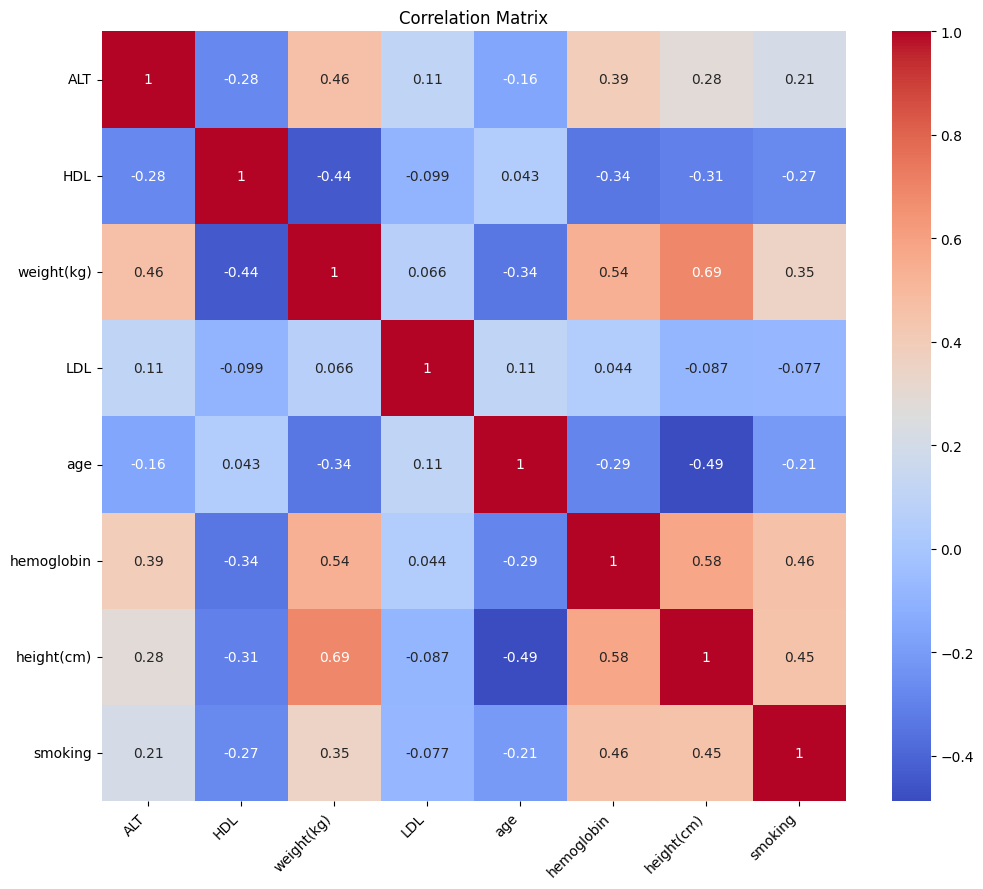

In [81]:
# correlation_matrix for all columns
correlation_matrix = data.drop(['id'], axis=1).corr()
plt.figure(figsize=(12,10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.xticks(rotation=45, ha='right')  
plt.yticks(rotation=0) 
plt.title('Correlation Matrix')
plt.show()

### Using normalization 

#### Normalization with Log Transformation

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3676557910.py:11: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3676557910.py:11: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3676557910.py:11: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3676557910.py:11: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3676557910.py:11: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3676557910.py:11: UserWarning:

The figure layout has changed to tight



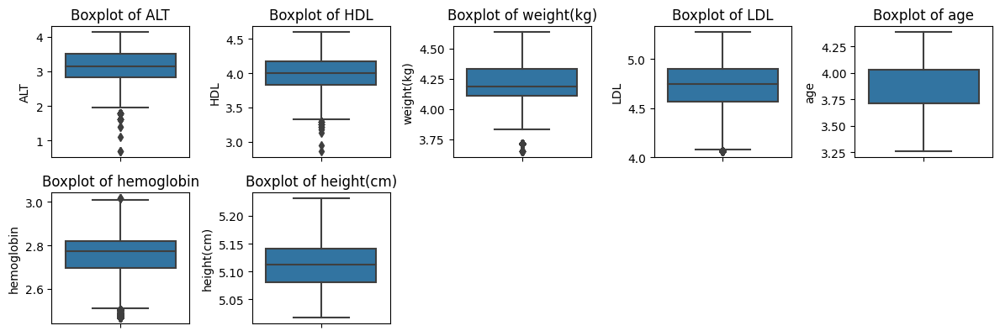

In [82]:
# Normalization with Log Transformation
data_scaled = np.log1p(data)

numerical_cols = ['ALT', 'HDL', 'weight(kg)', 'LDL', 'age', 'hemoglobin', 'height(cm)']

plt.figure(figsize=(12, 10))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 5, i)  
    sns.boxplot(y=data_scaled[col])
    plt.title(f'Boxplot of {col}')
    plt.tight_layout() # case warning but needed to see data

plt.show()

Normalization with Log Transformation not appears a good normalizer as it make outliers in both lower and upper bounds

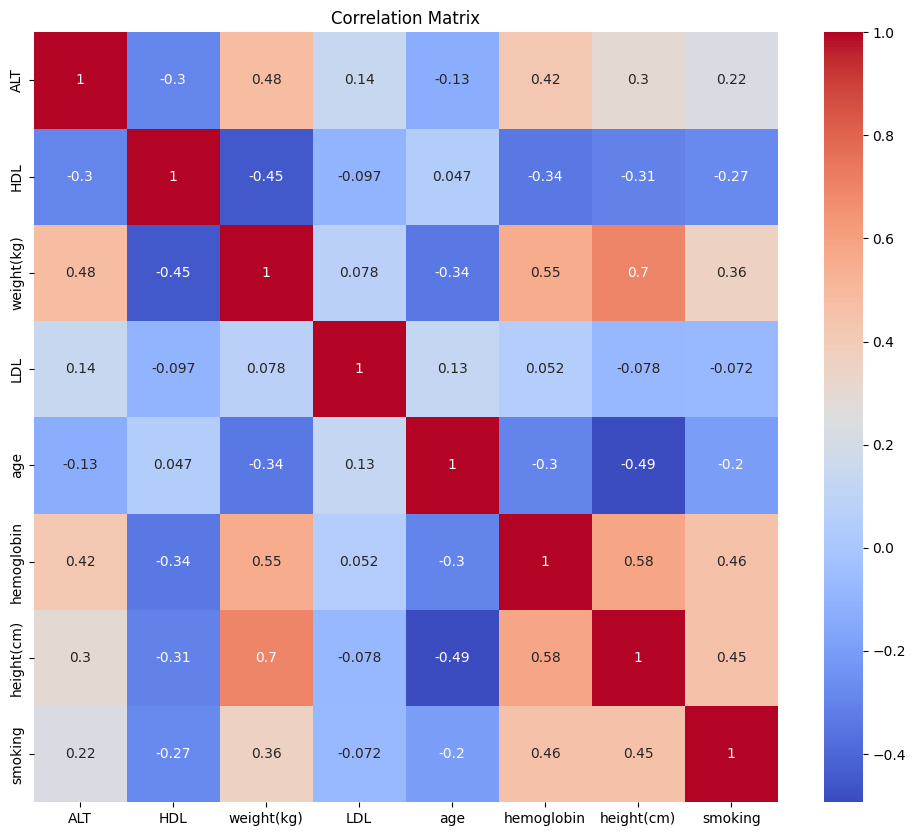

In [83]:
# Calculate the correlation matrix
correlation_matrix = data_scaled.drop(['id'], axis=1).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title(f'Correlation Matrix')
plt.show()

#### Normalization with StandardScaler

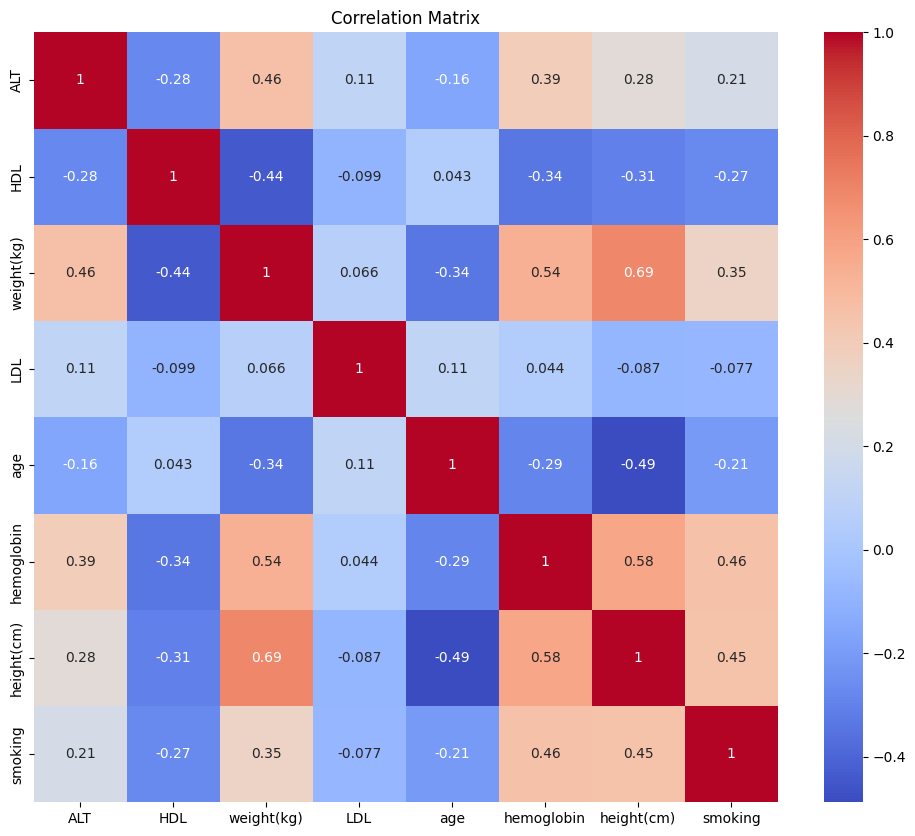

In [84]:
# Normalization with StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data.drop(['id'], axis=1))
data_scaled_df = pd.DataFrame(data_scaled, columns=data.drop(['id'], axis=1).columns)

# Calculate the correlation matrix
correlation_matrix = data_scaled_df.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title(f'Correlation Matrix')
plt.show()


C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\2863102984.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\2863102984.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\2863102984.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\2863102984.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\2863102984.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\2863102984.py:9: UserWarning:

The figure layout has changed to tight



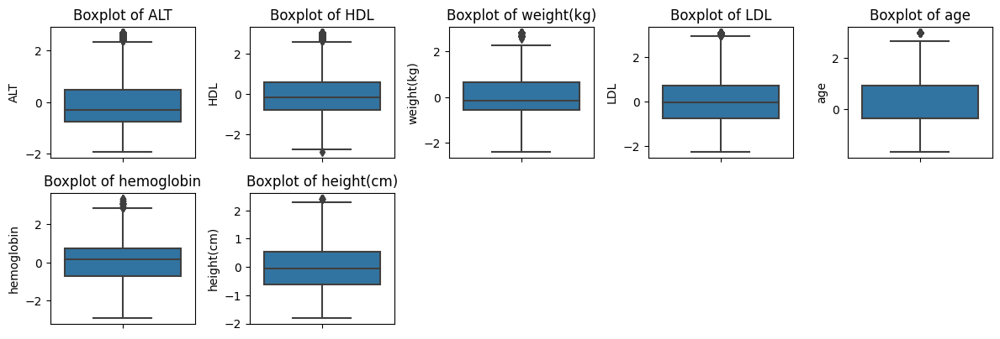

In [85]:
# box plot for columns
numerical_cols = ['ALT', 'HDL',  'weight(kg)', 'LDL', 'age', 'hemoglobin', 'height(cm)']

plt.figure(figsize=(12, 10))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 5, i)  
    sns.boxplot(y=data_scaled_df[col])
    plt.title(f'Boxplot of {col}')
    plt.tight_layout() # case warning but needed to see data

plt.show()

#### Normalization with MinMaxScaler

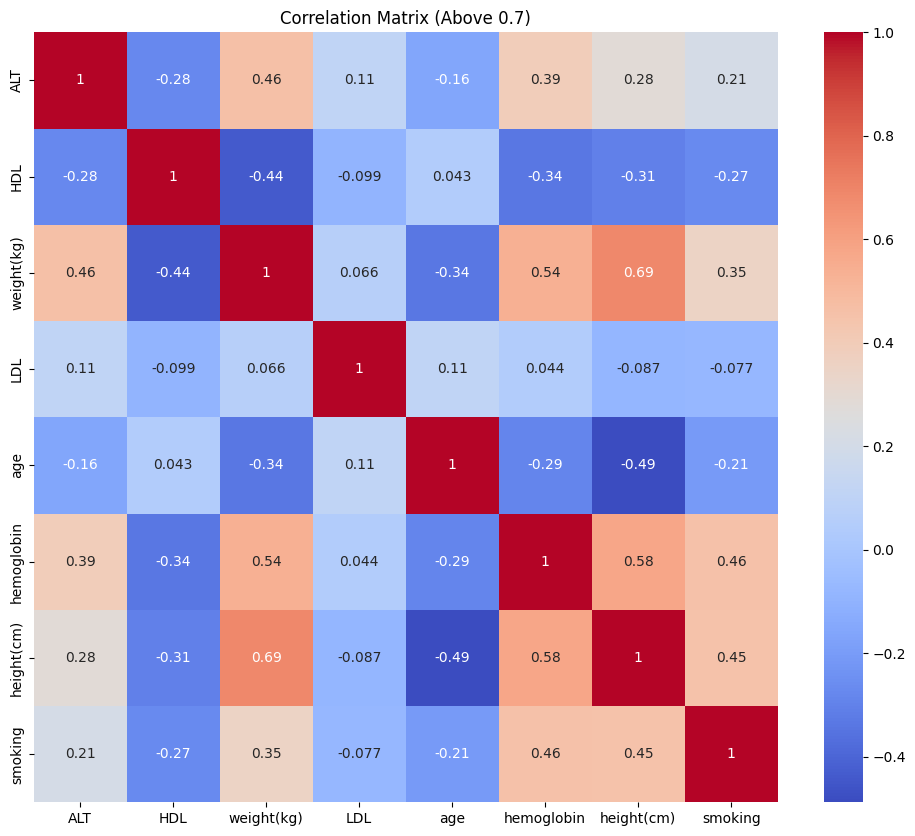

In [86]:
# Normalization with MinMaxScaler
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data.drop(['id'], axis=1))
data_scaled_df = pd.DataFrame(data_scaled, columns=data.drop(['id'], axis=1).columns)
# Calculate the correlation matrix
correlation_matrix = data_scaled_df.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title(f'Correlation Matrix (Above {threshold})')
plt.show()


C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight



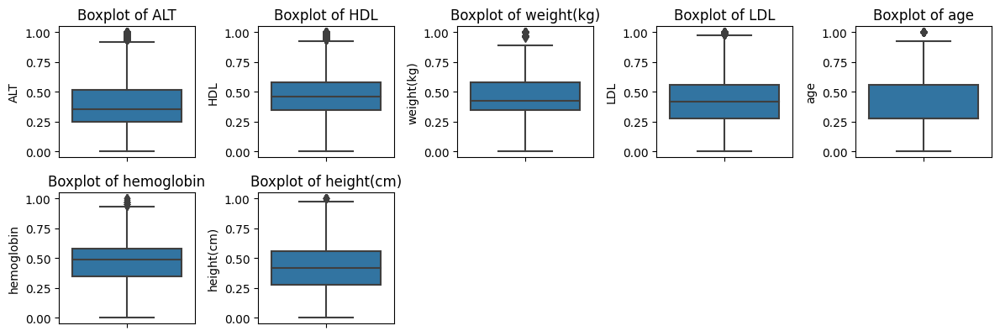

In [87]:
# box plot for columns standerd
numerical_cols = ['ALT', 'HDL', 'weight(kg)', 'LDL', 'age', 'hemoglobin', 'height(cm)']

plt.figure(figsize=(12, 10))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 5, i)  
    sns.boxplot(y=data_scaled_df[col])
    plt.title(f'Boxplot of {col}')
    plt.tight_layout() # case warning but needed to see data

plt.show()


#### Normalization with RobustScaler

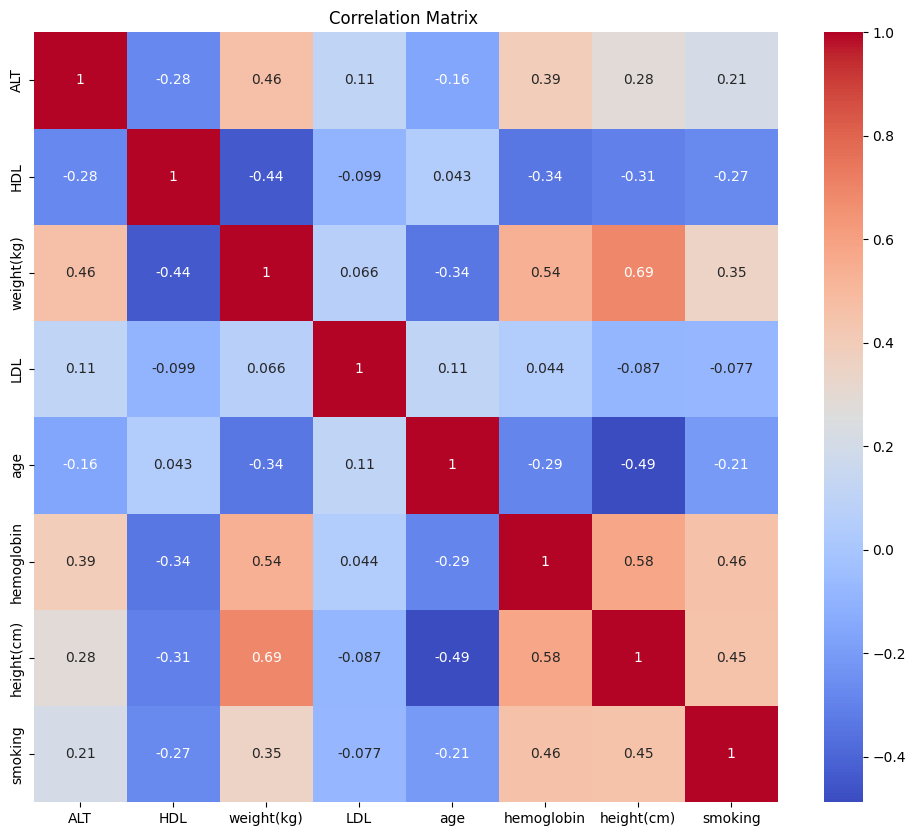

In [88]:
# Normalization with RobustScaler
scaler = RobustScaler()
data_scaled = scaler.fit_transform(data.drop(['id'], axis=1))
data_scaled_df = pd.DataFrame(data_scaled, columns=data.drop(['id'], axis=1).columns)
# Calculate the correlation matrix
correlation_matrix = data_scaled_df.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title(f'Correlation Matrix ')
plt.show()


C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_31592\3500084342.py:9: UserWarning:

The figure layout has changed to tight



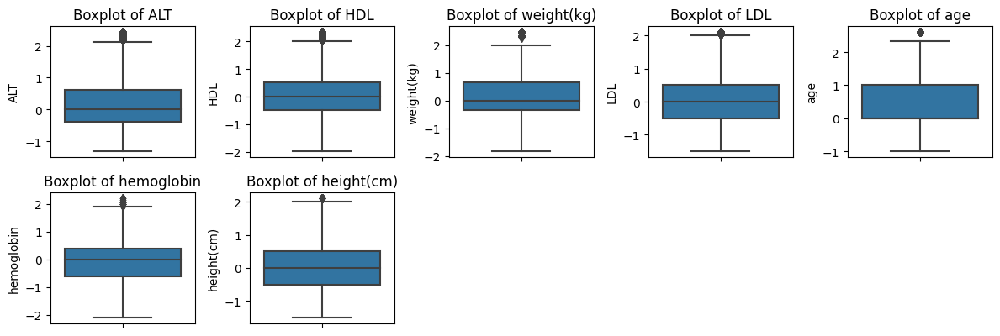

In [89]:
# box plot for columns standerd
numerical_cols = ['ALT', 'HDL', 'weight(kg)', 'LDL', 'age', 'hemoglobin', 'height(cm)']

plt.figure(figsize=(12, 10))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 5, i)  
    sns.boxplot(y=data_scaled_df[col])
    plt.title(f'Boxplot of {col}')
    plt.tight_layout() # case warning but needed to see data

plt.show()


### trial lasso & RFE

In [90]:
# lasso
from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.01) 
lasso.fit(data.drop(['id'],axis=1), data['smoking'])

selected_features = data.drop(['id'],axis=1).columns[lasso.coef_ != 0]
print("Selected features:", selected_features)

Selected features: Index(['ALT', 'HDL', 'weight(kg)', 'LDL', 'height(cm)', 'smoking'], dtype='object')


In [91]:
# RFE
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()
rfe = RFE(estimator=model, n_features_to_select=10) # n_features_to_select change no. if u need
rfe.fit(data.drop(['id'],axis=1), data['smoking'])

selected_features = data.drop(['id'],axis=1).columns[rfe.support_]
print("Selected features:", selected_features)


Selected features: Index(['ALT', 'HDL', 'weight(kg)', 'LDL', 'age', 'hemoglobin', 'height(cm)',
       'smoking'],
      dtype='object')
